## pybullet_kitchen
This notebook allows you to run a PyBullet simulation of a simple kitchen environment with articulated drawers. See https://github.com/alphonsusadubredu/pybullet_kitchen for more information. 

This notebook was created for the purpose of running this simulation using Google Colab's compute. Because X11 windows and OpenGL aren't supported in Colab, this simulation runs in DIRECT mode.

## Setup

In [ ]:
# Installing PyBullet using pip should take around 20 seconds, since we use precompiled Linux wheels.
# For more info, check the PyBullet quickstart guide here:
# https://docs.google.com/document/d/10sXEhzFRSnvFcl3XxNGhnD4N2SedqwdAvK3dsihxVUA/edit#heading=h.2ye70wns7io3

%%time
!pip install pybullet
!pip install numpngw
!pip install imageio

# Get repo from https://github.com/alphonsusadubredu/pybullet_kitchen
!curl https://codeload.github.com/alphonsusadubredu/pybullet_kitchen/tar.gz/main | \
  tar -xz --strip=1 pybullet_kitchen-main

In [ ]:
# You can enable the GPU by changing the runtime
import os
os.environ['MESA_GL_VERSION_OVERRIDE'] = '3.3'
os.environ['MESA_GLSL_VERSION_OVERRIDE'] = '330'
import random
import time
import pybullet as p
import pybullet_data as pd
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import pylab
from imageio import mimsave
from IPython.display import Image

%matplotlib inline

# Optionally enable GPU for faster rendering in pybullet.getCameraImage
enableGPU = True

!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
import GPUtil as GPU
import sys
# Get all device ids and their processing and memory utiliazion
# (deviceIds, gpuUtil, memUtil) = GPU.getGPUs()

# Print os and python version information
print('OS: ' + sys.platform)
print(sys.version)

# Print package name and version number
print(GPU.__name__ + ' ' + GPU.__version__)

# Show the utilization of all GPUs in a nice table
GPU.showUtilization()

# Show all stats of all GPUs in a nice table
GPU.showUtilization(all=True)

# NOTE: If all your GPUs currently have a memory consumption larger than 1%,
# this step will fail. It's not a bug! It is intended to do so, if it does not
# find an available GPU.
GPUs = GPU.getGPUs()
numGPUs = len(GPU.getGPUs())
print("numGPUs=",numGPUs)
if numGPUs > 0:
    enableGPU = True
eglPluginId = -1
if enableGPU:
    p.connect(p.DIRECT)
    import pkgutil
    egl = pkgutil.get_loader('eglRenderer')
    if (egl):
        eglPluginId = p.loadPlugin(egl.get_filename(), "_eglRendererPlugin")
    else:
        eglPluginId = p.loadPlugin("eglRendererPlugin")

if eglPluginId>=0:
    print("Using GPU hardware (eglRenderer)")  
else:
    print("using CPU renderer (TinyRenderer)")

## Custom Kitchen Example
How it works:  
This simulation is running in `DIRECT` mode, so we don't have access to PyBullet's real time simulation capabilities. Instead, we set up a camera and capture a frame every few steps of the simulation (every few calls to `pybullet.stepSimulation()`). Then we concatenate the frames at the end into an animated GIF, which acts as our "video simulation".

In [3]:
# Capturing frames to emulate recording

def capture_frame():
    # camera POV/FOV and image parameters, modify as necessary 
    camTargetPos = [-5,0,1.477]
    yaw = 90
    pitch = -10.0
    roll = 0
    upAxisIndex = 2
    camDistance = 3
    nearPlane = 0.01
    farPlane = 100
    fov = 60
    pixelWidth = 500
    pixelHeight = 300

    viewMatrix = p.computeViewMatrixFromYawPitchRoll(camTargetPos, camDistance, yaw, pitch, roll, upAxisIndex)
    aspect = pixelWidth / pixelHeight
    projectionMatrix = p.computeProjectionMatrixFOV(fov, aspect, nearPlane, farPlane)

    img_arr = p.getCameraImage(pixelWidth,pixelHeight,viewMatrix,projectionMatrix)
    w = img_arr[0]  #width of the image, in pixels
    h = img_arr[1]  #height of the image, in pixels
    rgb = img_arr[2]  #color data RGB
    dep = img_arr[3]  #depth data
    # print("w=",w,"h=",h)
    np_img_arr = np.reshape(rgb, (h, w, 4))
    frame = np_img_arr[:, :, :3]
    return frame

def capture_sim(steps_per_frame, total_steps):
    frames = []
    for i in range(total_steps):
        p.stepSimulation()
        if i % steps_per_frame == 0:
            frames.append(capture_frame())
    return frames

In [4]:
# Example based on https://github.com/alphonsusadubredu/pybullet_kitchen/blob/main/src/kitchen.py

class Kitchen:
    def __init__(self): 
        p.setAdditionalSearchPath('/models')
        kitchen_path = 'kitchen_description/urdf/kitchen_part_right_gen_convex.urdf'
        useFixedBase = True
        p.setGravity(0, 0, -9.81)  
        self.floor = p.loadURDF('floor/floor.urdf',useFixedBase=useFixedBase)
        self.kitchen = p.loadURDF(kitchen_path,[-5,0,1.477],useFixedBase=useFixedBase)
        self.table = p.loadURDF('table/table.urdf',[1.0,0,0], p.getQuaternionFromEuler([0,0,1.57]), useFixedBase=useFixedBase)
        self.drawer_to_joint_id = {1: 18, 
                                   2: 22, 
                                   3: 27, 
                                   4: 31,
                                   5: 37, 
                                   6: 40, 
                                   7: 48, 
                                   8: 53, 
                                   9: 56, 
                                   10: 58, 
                                   11: 14}
        self.drawer_to_joint_limits = {1: (0, 1.57), 
                                       2: (-1.57, 0), 
                                       3: (-1.57, 0), 
                                       4: (0, 1.57),
                                       5: (0.0, 0.4), 
                                       6: (0.0, 0.4), 
                                       7: (0, 1.57), 
                                       8: (-1.57, 0), 
                                       9: (0.0, 0.4), 
                                       10: (0.0, 0.4), 
                                       11: (0, 1.57)}
        
            
    def open_drawer(self, drawer_id):
        joint_id = self.drawer_to_joint_id[drawer_id]
        open_angle = self.drawer_to_joint_limits[drawer_id][1]
        p.setJointMotorControl2(bodyIndex=self.kitchen, jointIndex=joint_id, controlMode=p.POSITION_CONTROL, targetPosition=open_angle, maxVelocity=0.5)

    def close_drawer(self, drawer_id):
        joint_id = self.drawer_to_joint_id[drawer_id]
        close_angle = self.drawer_to_joint_limits[drawer_id][0]
        p.setJointMotorControl2(bodyIndex=self.kitchen, jointIndex=joint_id, controlMode=p.POSITION_CONTROL, targetPosition=close_angle, maxVelocity=0.5)

Creating animated GIF, please wait a few seconds...
CPU times: user 3.67 s, sys: 26.6 ms, total: 3.69 s
Wall time: 3.7 s
CPU times: user 1.57 ms, sys: 6.97 ms, total: 8.53 ms
Wall time: 7.08 ms


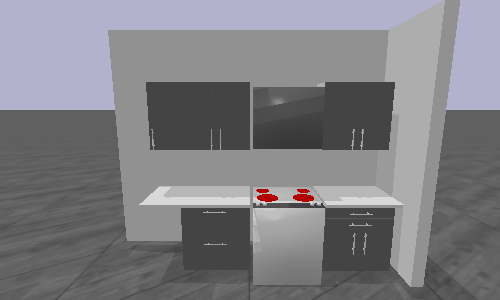

In [5]:
# Run simulation and visualize

p.connect(p.DIRECT) # can't run GUI mode on Colab
p.resetSimulation()

p.setGravity(0, 0, -9.81)
p.setPhysicsEngineParameter(enableConeFriction=0)

# Change framerate of gif here
total_steps_per_control = 1000
steps_per_frame = 100

frames = []
kitchen = Kitchen()

# open all drawers
for i in range(10):
    drawer_id = i+1
    kitchen.open_drawer(drawer_id)
    frames += capture_sim(steps_per_frame, total_steps_per_control)

# close all drawers
for i in range(10):
    drawer_id = i+1
    kitchen.close_drawer(drawer_id)
    frames += capture_sim(steps_per_frame, total_steps_per_control)

print("Creating animated GIF, please wait a few seconds...")
%time mimsave("kitchen_ipynb.gif", frames)
%time Image(open("kitchen_ipynb.gif", 'rb').read())